#  End-to-end Multi class Dog Breed Classification

## 1. Problem

- Identifying the breed of a dog given an image of a dog

## 2. Data
The data we're using is from kaggle's dog breed Identification competition


https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The Evaluation is a file with prediction probabilities for each dog breed of each test image

## 4. Features
**Some info abou the data :**
- We're Dealing with Images (Unstructured data), so it's probably best we use deep learning / transfer learning .
- There are 120 breeds of dogs (this means there are 120 different classes )
- There are around 10,000+ images in the training set  (have labels)
- there are around 10,000+ images in the test set  (have no labels 'cause we'll want to predict them)



## Get our Workspace ready

In [1]:
import tensorflow as tf
import tensorflow_hub as hub

print(tf.__version__)
print(hub.__version__)



2.16.1
0.16.1


## Getting our data ready (Turning into Tensors)

with all ML models, our data has to be numerical format

so that's what we'll doing first ==> turning our images into Tensors (Numercial Representation)

In [2]:
# Check out the labels of our data
import pandas as pd
labels_csv= pd.read_csv('/kaggle/input/dog-breed-identification/labels.csv')

print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


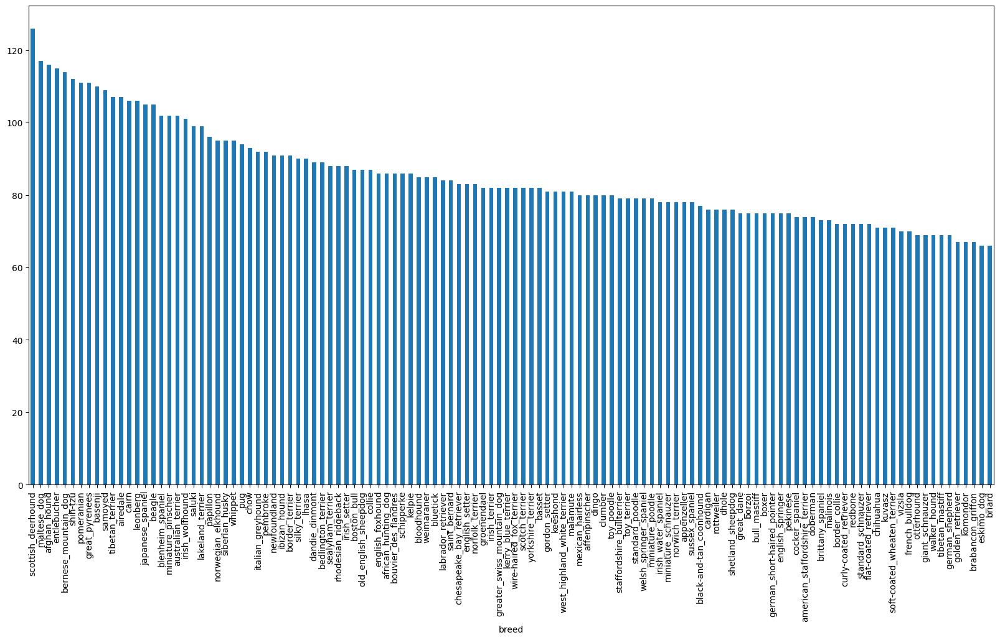

In [4]:
# how many iamge
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));

In [5]:
labels_csv['breed'].value_counts().median()

82.0

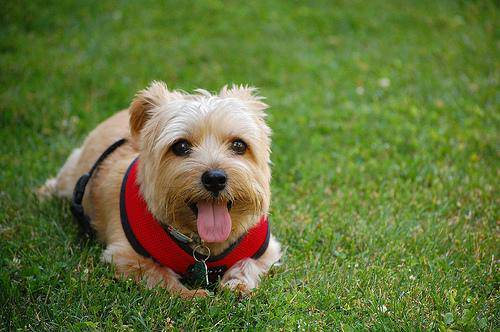

In [6]:
from IPython.display import Image
Image('/kaggle/input/dog-breed-identification/train/0075dc49dab4024d12fafe67074d8a81.jpg')

### Getting images and their labels

- Let's get a list of all of our image file pathnames

In [7]:
# Create path name from images ID's
filenames= ["/kaggle/input/dog-breed-identification/train/"+fname + ".jpg" for fname in labels_csv['id']]
# Check the first 10
filenames[:10]

['/kaggle/input/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/kaggle/input/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/kaggle/input/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/kaggle/input/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/kaggle/input/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/kaggle/input/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/kaggle/input/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/kaggle/input/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/kaggle/input/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/kaggle/input/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
# Check whether number of filenames matches number of actual image file

import os
if len(os.listdir("/kaggle/input/dog-breed-identification/train/"))== len(filenames):
  print("Filename match actual amount of files!!! Proceed. ")
else:
  print("Filename NOT match actual amount of files, Check the target directory ")


Filename match actual amount of files!!! Proceed. 


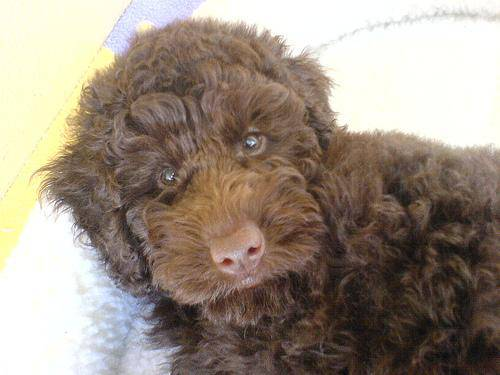

In [9]:
# one more check
Image(filenames[404])


Since we've now got our training images filepaths in a list, let's prepare our labels

In [10]:
import numpy as np

labels= labels_csv['breed'].to_numpy()
#labels= np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [11]:
len(labels)

10222

In [12]:
# See if number of labels matches the number of filenames
if len(labels)== len(filenames):
  print("Number of labeles matches number of filenames!")
else:
  print("NUmber of Labels doesn't match number of filename, check data Dirs")

Number of labeles matches number of filenames!


In [13]:
# Find the Unique label values
unique_breeds= np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [14]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [15]:
# Turn every label into a boolean array

boolean_labels= [label== unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [16]:
len(boolean_labels)

10222

In [17]:
# Example: Turning boolean array into int
print(labels[0]) # Original label
print(np.where(unique_breeds==labels[0])) # index of the labels occurs

print(boolean_labels[0].argmax()) # index where label occurs in boolean array

print(boolean_labels[0].astype(int)) # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our Own Validation Dataset

Since the dataset from kaggle dones't come with a validation set . we're going to create our own

In [18]:
# Setup X & Y Variables

x= filenames
y= boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed

In [19]:
# Set number of image to use for experminting

NUM_IMAGES=1000 # @param{type:'slider',min:1000,max:10000,step:100}

In [20]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUM_IMAGES

X_train, X_val , Y_tarin, Y_val = train_test_split(x[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size=0.2,
                                                   random_state=42)

len(X_train) , len(Y_tarin) , len(X_val) , len(Y_val)

(800, 800, 200, 200)

In [21]:
# let's have a geez at the training data

X_train[:3] , Y_tarin[:3]

(['/kaggle/input/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/kaggle/input/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/kaggle/input/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, Fa

## Preprocessing Images (Turning images into tensors)

* To Preprocess our images into Tensors we're going to write a function whitch does a few things:
 1. Take an image filepath as input
 2. Use TansorFlow to read the file and save it to a var `image`
 3. Turn our `image` into Tensors
 4. Resize the `image` to be a shape (244,244)
 5. Return the modified `image`

In [22]:
# Convert an image into Numpy Array

from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [23]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [24]:
# turn image into Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [25]:
# Define image size
IMG_SIZE= 224

# Create a function for preprocessing images

def process_image(image_path, image_size=IMG_SIZE):
  """
  Takes an images filepath and turns the image into a Tensor.
  """
  # Read an image file
  image= tf.io.read_file(image_path)
  # Trun the image into numerical Tensor with 3 color channels (red ,green,blue)
  image= tf.image.decode_jpeg(image,channels=3)
  # Convert the color channel values from 0-255 to 0-1 values (Normalization)
  image= tf.image.convert_image_dtype(image,tf.float32)
  # Rsize the image to our desired value (244,244)
  image= tf.image.resize(image,size=[image_size,image_size])
  return image



## Turning our data into batches

Why turn our data into batches ??

Let's say you're trying to process 10,000+ images in one go..
they all might be fit into memory

so that's why we do about 32 (batch side) images at a time (You can manually adjust the batch size if need be)

In Order to use TensorFlow Effectively, we need our data in the form of Tensors tuples .(`image`,`label`)

In [26]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Take an image file path name and the assoicated label,
  processes the image and returns a tuble of image label
  """
  image= process_image(image_path)
  return image , label


In [27]:
(process_image(x[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tubles of tensors
in the form : (`image`,`label`) let's make a function to turn all of our data (`x` & `y` ) into batches

In [28]:
# Define the batch size , 32 is a good start

BATCH_SIZE= 32

# Lets Create a function to turn data into batches

def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Create batches of data out of images (x) and label (y) paris.
  Shuffle the data if it's training data but doesn't shuffle it's validation data.
  Also accespts test data as input (no label) .
  """
  # If the data is test data set, we Probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data= tf.data.Dataset.from_tensor_slices(tf.constant(x))  # only filepath (no labels)
    data_batch= data.map(process_image).batch(batch_size)
    return data_batch
  elif valid_data:
    print("Creating valid data batches.....")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(x), # file path
                                             tf.constant(y)))  # labels

    data_batch= data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating data batche......")
    # Turn file path and labels into Tensors
    data= tf.data.Dataset.from_tensor_slices((tf.constant(x), # file path
                                             tf.constant(y)))  # labels
    # Shuffling the pathnames and labels before mapping image processor function is faster than shuffing images
    data= data.shuffle(buffer_size=len(x))
    # Create (image,labels) tubles (this also turns the image path into a pre-processd image)
    data= data.map(get_image_label)
    # Turn the training data into batches
    data_batch= data.batch(batch_size)
    return data_batch

In [29]:
# Create training data  and validation data batches

train_data= create_data_batches(X_train,Y_tarin)
val_data= create_data_batches(X_val,Y_val,valid_data=True)

Creating data batche......
Creating valid data batches.....


In [30]:
# Check out the different attributes of our data batches

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visulaizing Data Batches

our data is now in batches , however, these can be a little hard to understand/comprehend, Let's Visualize them!


In [31]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch

def show_25_images(images,labels):
  """
  Displays a plot of 25 images and there lables from a data batch

  """
  # Setup a figure
  plt.figure(figsize=(10,10))
  # Loop thorw 25 (for displaying 25 images)
  for i in range(25):
    # Create a subplots
    ax=plt.subplot(5,5,i+1)
    # Display an images
    plt.imshow(images[i])
    # Add the image label as a title
    plt.title(unique_breeds[labels[i].argmax()])
    # Trun the grid line off
    plt.axis('off')




In [32]:
train_images, train_labels= next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.4686362 , 0.48284388, 0.4388923 ],
          [0.43491846, 0.46069017, 0.4125102 ],
          [0.45447832, 0.4979307 , 0.44302875],
          ...,
          [0.43456125, 0.5049195 , 0.28860298],
          [0.39823228, 0.4980573 , 0.26960978],
          [0.37409884, 0.48390275, 0.24988663]],
 
         [[0.43431306, 0.46279556, 0.4211807 ],
          [0.43068317, 0.4688092 , 0.42564145],
          [0.45039746, 0.49808303, 0.45071962],
          ...,
          [0.43917897, 0.51070905, 0.3056251 ],
          [0.3906706 , 0.4944172 , 0.2534024 ],
          [0.34645557, 0.4601811 , 0.20911317]],
 
         [[0.41501755, 0.4622952 , 0.4238247 ],
          [0.40084037, 0.4505865 , 0.40968493],
          [0.44426945, 0.4941148 , 0.45284492],
          ...,
          [0.4272146 , 0.50133634, 0.31526017],
          [0.38620418, 0.48767138, 0.25313336],
          [0.33333334, 0.44705886, 0.19360997]],
 
         ...,
 
         [[0.8738844 , 0.8699628 , 0.8621197 ],
          [0.84672

In [33]:
len(train_images), len(train_labels)

(32, 32)

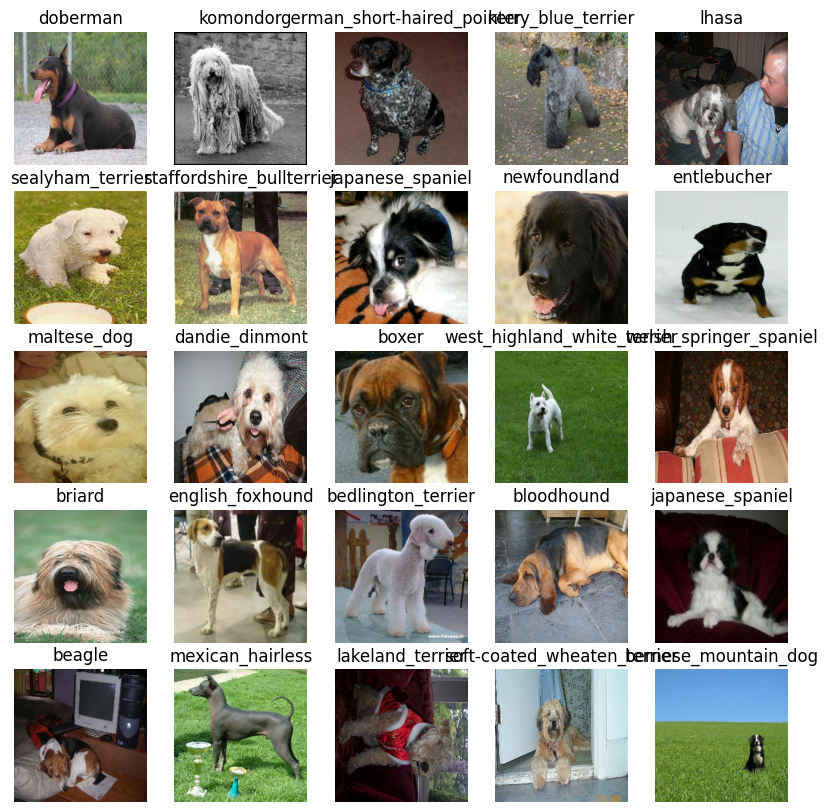

In [34]:
show_25_images(train_images,train_labels)

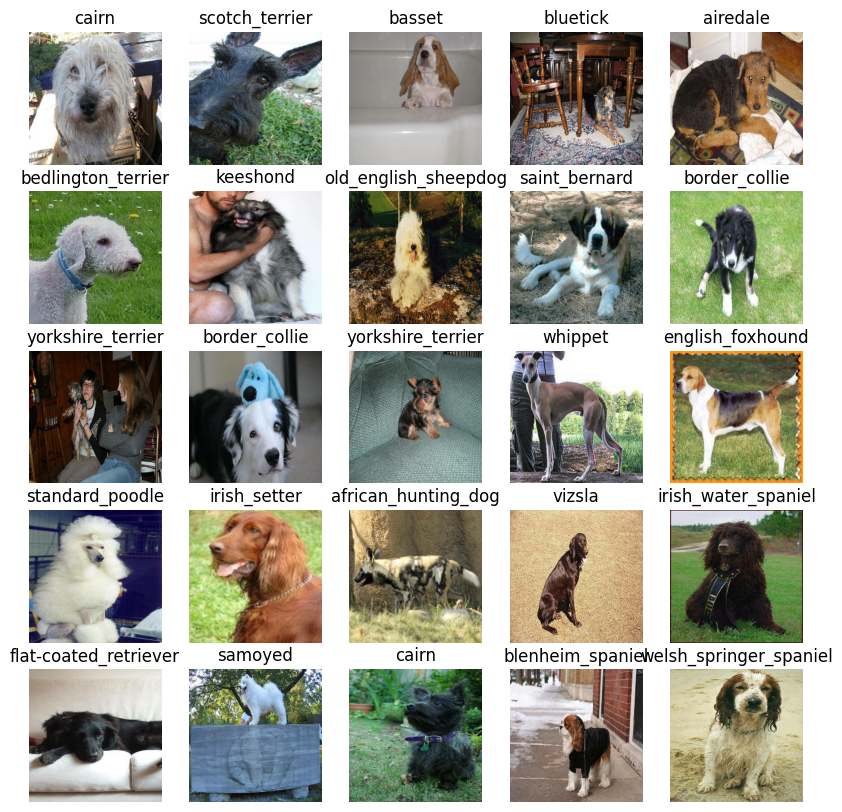

In [35]:
# Now Let's Visualize our validation data set
val_image, val_labels= next(val_data.as_numpy_iterator())
show_25_images(val_image,val_labels)

## Building a model

Before we build a model, there are few things we need to define:

* The Input shape (Our image shape, in the form of Tensors) to our model
* The Output (image labels in the form of Tensors) of our mode.
* The URL of the model we want to use ('cause we use Transfer learning/ Fine-Tuning)

In [36]:
# Setup input shape to the model
INPUT_SHAPE= [None, IMG_SIZE,IMG_SIZE,3] # Batch , hight , width , color channels

# Setup the output shape
OUTPUT_SHAPE= len(unique_breeds)

# Setup model Url from Tensorflow hub
MODEL_URL= "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"



We've got our inputs, outputs and model ready to go .

let's put them together into keras deep learning model

Knowing this , let's create a function which:
* Takes the input shape , output shape and the model as parameter
*  Define the layers in a keras model in squential fashion
(do this first , then this , then that)..
* Compiles the model (says how it should be evaluated and Improved)
* Build the model (tells the model the input shape it'll be getting )
* Returns the model

In [37]:
import tf_keras as tfk

# Create a function to build a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:" , model_url)
  # Setup the model Layers
  model= tfk.Sequential([
        hub.KerasLayer(model_url),
                       tfk.layers.Dense(units=output_shape, activation='softmax')
                       ])

    # compile the model
  model.compile(
        loss=tfk.losses.CategoricalCrossentropy(),
        optimizer=tfk.optimizers.Adam(),
        metrics=['accuracy']
    )

    # build the model
  model.build(input_shape)

  return model

In [38]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Createing Callbacks

callbacks are helper functions a model can use during training to do such things as save it's progress, check it's prograss or stop training early if the model stop improving

We'll Create two callbacks, one for TensorBoard which helps track our model progress and another for early stopping

### TensorBoard Callback

We need to do 3 things :
1. Load The TensorBoard notebook Extension.
2. Create a TensorBoard callback which able to save logs to a directory
and pass it to our model `fit()` function
3. Visualize our model training logs with `%TensorBoard` Magic function

In [39]:
# Load TensorBoard
%load_ext tensorboard

In [40]:
import datetime
import tf_keras
import os
# Create a funciton to Bulild a TensorBoard callback

def create_tensorboard_callback():
  # Create a log dir for storing tensorboard
  logdir=os.path.join('/kaggle/working/dogify/logs',
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(log_dir=logdir)

### Early stopping Callback

stop our model from overfitting by stopping training if a certain evaluation metric stops improving

In [41]:
# Create early stopping call back
early_stopping= tf_keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)


## Training a model (on a subset of data)

Our first model is only going to train a 1000 images, to make sure everthing is working

In [42]:
NUM_EPOCHS = 100 # @param {type:'slider',step:10,min:10,max:100}

Let's Create a function to train our model

* Create a model using `create_model()`
* Setup TensorBoard callbacks using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for
* Return a model

In [43]:
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model= create_model()
  # Create New Tensorborad every time we train a model
  tensorbaorad= create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorbaorad,early_stopping]
            )
  # Return the fitted model

  return model


In [44]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100


I0000 00:00:1729177340.916373     103 service.cc:145] XLA service 0x7da034c00790 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729177340.916431     103 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1729177341.090618     103 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


25/25 [==============================] - 28s 132ms/step - loss: 4.7961 - accuracy: 0.0725 - val_loss: 3.5909 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 1s 43ms/step - loss: 1.7342 - accuracy: 0.6737 - val_loss: 2.2793 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 1s 44ms/step - loss: 0.5992 - accuracy: 0.9325 - val_loss: 1.7259 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 1s 43ms/step - loss: 0.2653 - accuracy: 0.9837 - val_loss: 1.5183 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 1s 44ms/step - loss: 0.1531 - accuracy: 0.9975 - val_loss: 1.4341 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 1s 43ms/step - loss: 0.1036 - accuracy: 0.9987 - val_loss: 1.3866 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 1s 44ms/step - loss: 0.0777 - accuracy: 1.0000 - val_loss: 1.3509 - val_accuracy: 0.6450
Epoch 8/100
25/2

Its look like our model is overfitting because it's performing far better on the training set than the validation set

**NOTE**: overfitting to begin with is a good thing. it means our model is learning!! 📗

### check the tensorboard logs

The Tensorboard Magic function (`%tensorboard`) will access the logs directory we created earlier and Visulaize it's content

In [45]:
### check the tensorboard
%tensorboard --logdir /content/drive/MyDrive/Dog-Vision/logs

## Making and Evaluation prediction using a trained model

In [46]:
# make perdiction on the validation data
predicitons= model.predict(val_data,verbose=1)
predicitons

7/7 [==============================] - 1s 34ms/step


array([[6.2783929e-03, 8.7586064e-05, 1.5294930e-03, ..., 1.3243068e-04,
        3.1662723e-05, 3.9194557e-03],
       [1.3173902e-03, 7.8598959e-03, 3.7692315e-03, ..., 3.8422333e-04,
        2.2972920e-03, 1.8667335e-04],
       [4.5940087e-05, 3.0697157e-04, 8.4124964e-05, ..., 3.2879652e-05,
        6.3577994e-05, 3.6910889e-04],
       ...,
       [6.6508542e-06, 1.4505764e-06, 3.0544252e-05, ..., 9.6728372e-06,
        7.3963522e-05, 2.1462833e-05],
       [3.2357750e-03, 2.4905248e-04, 2.7643470e-04, ..., 1.5565996e-04,
        1.1908827e-04, 1.7769745e-02],
       [1.9102837e-03, 1.3703999e-05, 9.7159698e-04, ..., 8.0076111e-03,
        1.8827285e-03, 3.6241356e-05]], dtype=float32)

In [47]:
predicitons.shape

(200, 120)

In [48]:
# First predictions
index=0
print(predicitons[0])
print(f"Max value (probablity of prediction ):{np.max(predicitons[index])}")
print(f"sum :{np.sum(predicitons[index])}")
print(f"max value : {np.argmax(predicitons[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predicitons[index])]}")

[6.27839286e-03 8.75860642e-05 1.52949302e-03 1.02697944e-04
 1.24781800e-04 1.55890419e-04 2.02654582e-02 1.30736548e-03
 2.05201548e-04 3.62220424e-04 2.87755800e-04 3.92638351e-04
 7.78961286e-04 7.98373600e-04 5.11516351e-04 1.61249435e-03
 2.01603150e-04 1.92892164e-01 3.28357892e-05 1.31869281e-04
 5.57404594e-04 2.69873650e-04 2.67961095e-05 1.88215217e-03
 1.53337132e-05 1.34637958e-04 1.09122500e-01 2.72207486e-04
 1.68147753e-03 3.82696831e-04 5.14420506e-04 1.35688821e-03
 2.03520438e-04 2.18248406e-05 1.10441171e-04 1.25778854e-01
 3.90506975e-05 3.75959178e-04 8.91840900e-05 5.34883118e-04
 8.50849668e-04 1.09623426e-04 6.48026617e-05 8.96575148e-05
 3.59076657e-05 6.38496072e-04 8.76194026e-05 2.46870623e-04
 4.97508619e-04 2.32703518e-04 5.80457330e-04 1.72156040e-04
 6.72996859e-04 2.93769233e-04 5.29090066e-05 3.98527009e-05
 2.39965811e-04 3.53917270e-03 4.17766889e-04 9.21083242e-02
 1.60733805e-04 1.76920963e-04 2.45088036e-03 3.03726556e-05
 1.09424768e-03 4.452033

Having the above functionality is greet but we want to be able to do it at scale.

And it would be even better if we could see the image , the prediction is being make on

**NOTE:** prediction probabitlity are also known as confidence level

In [49]:
# Trun probabilities into their respective label (eaier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label= get_pred_label(predicitons[0])
pred_label

'border_terrier'

Now since our validation data is still in a batch dataset, we'll have to un-batch it to make predictions on a validation images and then compare those predictions to the validation labels

In [50]:
# Create a function to un-batch
def unbatchify(data):
  """
  Takes a batch datasets of (image, label) Tensors and returns seperate arrays
   of images and labels
  """
  images=[]
  labels=[]
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
# Unbatch the validation
val_image , val_label= unbatchify(val_data)
val_image[0], val_label[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [51]:
get_pred_label(val_label[0])

'affenpinscher'

Now we've got way to get :
* Prediction labels
* Validation labels (Truth labels)
* validation images

let's make some functions to make these all a bit more visualize

---

We'll Create a function which:
* Take an array of predicitons probabilities, an array of truth labels and and array of images into integer.

* convert the perdiction probabilites to a predicted label
* plot the predicted label, it's predicted probability, the truth label and the target image on a single plot

In [52]:
def plot_pred(prediction_prob,labels,images,n=1):
  """
  View the prediction, ground truth and image for sample n
  """

  pred_prob, true_label, image = prediction_prob[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  # plot image & remove ticks
  plt.imshow(image)

  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label== true_label:
    color= 'green'
  else:
    color= 'red'

  # change the plot title to be predicted, probability of predictions and truth label
  plt.title(f"{pred_label} { np.max(pred_prob)*100:2.0f}%  {true_label}",color=color)





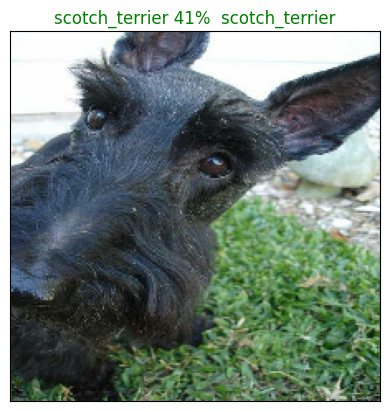

In [53]:
plot_pred(predicitons, labels=val_label,images=val_image,n=1)

Now we've got one function to visualize our models top predictions, let's make another to view our model top 10 predictions

This function will:
* Take an input of predictions probabilities array and a ground truth array and an int
* Find the predicted label using `get_pred_label()`
* find the top 10 :
  * Predictions Probabilities indexes
  * Predictions Probabilities values
  * Predictions labels
* Plot the top 10 predictions probabilities values and labels, Coloring the True labe with green🟢

In [54]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # finr the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # change the colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass


In [55]:
def plot_pred_conf(prediction_probabilities, labels,  n=1):
    """
    Plots the top 10 highest prediction confidences along with the true label for sample n.
    """
    pred_prob = prediction_probabilities[n]

    # Convert one-hot encoded `true_label` to class index
    true_label = np.argmax(labels[n])  # This assumes `labels` is one-hot encoded

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color='grey')
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation='vertical')

    # Change the color of the bar corresponding to the true label
    true_label_name = unique_breeds[true_label]  # Convert class index to label name
    if true_label_name in top_10_pred_labels:
        true_label_index = np.where(top_10_pred_labels == true_label_name)[0][0]
        top_plot[true_label_index].set_color('green')


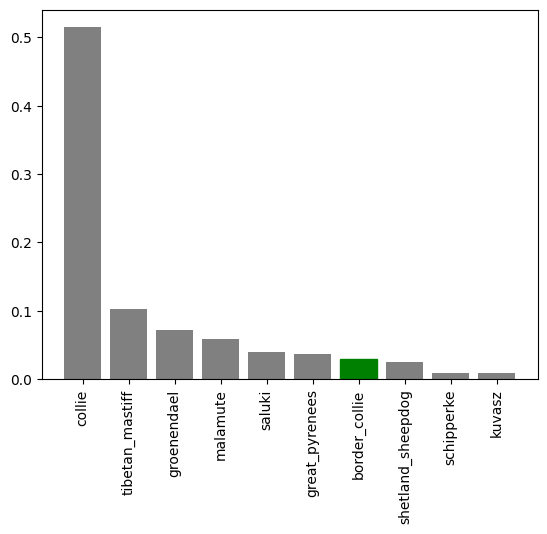

In [56]:
plot_pred_conf(prediction_probabilities=predicitons,
               labels=val_labels,
               n=9)

Now we've got some function to help use visualize our predictions and evalute our model
let's check out a few  

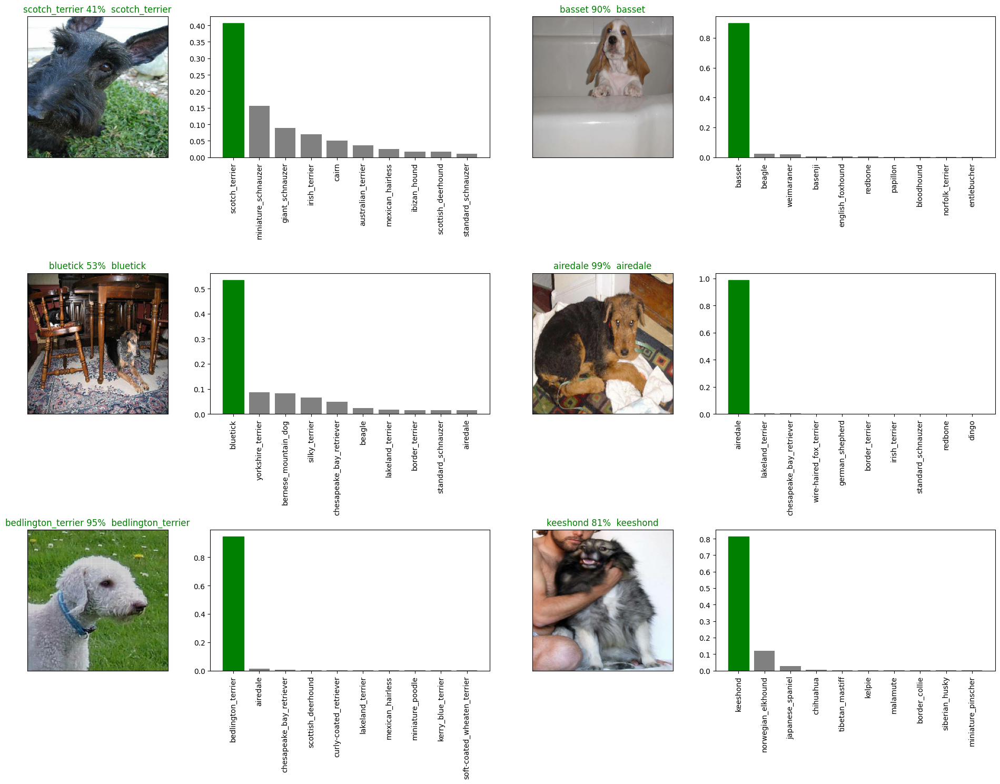

In [57]:
# Let's check out a few predictions and their different values
i_multiplier= 1
num_rows= 3
num_cols= 2
num_images= num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i +1)
  plot_pred(predicitons, labels=val_label,images=val_image,n=i + i_multiplier)

  plt.subplot(num_rows,2*num_cols , 2*i+2)
  plot_pred_conf(prediction_probabilities=predicitons,
                 labels=val_labels,
                 n= i+i_multiplier
                 )

  plt.tight_layout(h_pad=2)

plt.show()

## Saving and reloading a trained model


In [65]:
os.mkdir('/kaggle/working/dogify/models')

In [66]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models dir
  and append a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir= os.path.join("/kaggle/working/dogify/models/",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path= modeldir + "-"+ suffix + ".keras"
  print(f"saving  model to : {model_path}....")
  model.save(model_path)
  return model_path


Now we've got functions to save and load a trained model
let's make sure there are work


In [67]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

saving  model to : /kaggle/working/dogify/models/20241017-150921-1000-images-mobilenetv2-Adam.keras....


'/kaggle/working/dogify/models/20241017-150921-1000-images-mobilenetv2-Adam.keras'

In [69]:
# Load a trained model
path="/kaggle/working/dogify/models/20241017-150921-1000-images-mobilenetv2-Adam.keras"
loaded_1000_image_model=tfk.models.load_model(path,
                      custom_objects={"KerasLayer":hub.KerasLayer},
                      )

In [70]:
model.evaluate(val_data)

7/7 [==============================] - 0s 45ms/step - loss: 1.2641 - accuracy: 0.6500


[1.264106273651123, 0.6499999761581421]

In [71]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 38ms/step - loss: 1.2641 - accuracy: 0.6500


[1.264106273651123, 0.6499999761581421]

## Train a model in FULL data

In [72]:
len(x), len(y)

(10222, 10222)

In [73]:
## Create a data batch with the full dataset
full_data= create_data_batches(x,y)


Creating data batche......


In [74]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [75]:
full_model=create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [76]:
# Create full model callback
full_model_tensorboard= create_tensorboard_callback()
# No validation set when training on all the data, so we can't moitor validation accuracy
full_model_early_stopping= tf_keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [77]:
# Fit the full-model to the full data

full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping]
               )

Epoch 1/100
320/320 [==============================] - 25s 66ms/step - loss: 1.3268 - accuracy: 0.6679
Epoch 2/100
320/320 [==============================] - 10s 32ms/step - loss: 0.3998 - accuracy: 0.8826
Epoch 3/100
320/320 [==============================] - 11s 33ms/step - loss: 0.2366 - accuracy: 0.9375
Epoch 4/100
320/320 [==============================] - 10s 32ms/step - loss: 0.1529 - accuracy: 0.9646
Epoch 5/100
320/320 [==============================] - 10s 32ms/step - loss: 0.1049 - accuracy: 0.9789
Epoch 6/100
320/320 [==============================] - 11s 33ms/step - loss: 0.0775 - accuracy: 0.9854
Epoch 7/100
320/320 [==============================] - 10s 32ms/step - loss: 0.0589 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 10s 32ms/step - loss: 0.0457 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 11s 33ms/step - loss: 0.0369 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 10s 32ms/step - l

In [78]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

saving  model to : /kaggle/working/dogify/models/20241017-151429-full-image-set-mobilenetv2-Adam.keras....


'/kaggle/working/dogify/models/20241017-151429-full-image-set-mobilenetv2-Adam.keras'

In [79]:
path="/kaggle/working/dogify/models/20241017-151429-full-image-set-mobilenetv2-Adam.keras"
loaded_full_model=tfk.models.load_model(path,
                      custom_objects={"KerasLayer":hub.KerasLayer},
                      )

## Making predictions on a test dataset

since our model has beed trained on images in the form of Tensors batches, to make predictions on a test data . we'll have got it into the same format

To make predictions on the test data , we'll:
* Get the test images filenames.
* Convert the filenames into test data batch
* Make a Predictions array

In [80]:
# Load test image filenames
test_path='/kaggle/input/dog-breed-identification/test/'
test_filename= [test_path + fname for fname in os.listdir(test_path)]
test_filename[:10]

['/kaggle/input/dog-breed-identification/test/09e51e17e2b756ff2ace8a87bd1443fa.jpg',
 '/kaggle/input/dog-breed-identification/test/f7a32505c12649183c5991ecfa7d68b3.jpg',
 '/kaggle/input/dog-breed-identification/test/bc6d50ffb4644feb34530aa58943e85b.jpg',
 '/kaggle/input/dog-breed-identification/test/7cbc041e79135a572aad87904b5c9c57.jpg',
 '/kaggle/input/dog-breed-identification/test/f3b603f10d6a344f0395fb46b242ff8e.jpg',
 '/kaggle/input/dog-breed-identification/test/db55098d859d27a3c05b0e3fc41d43e7.jpg',
 '/kaggle/input/dog-breed-identification/test/665bab06a3ea861c0812c778486988e3.jpg',
 '/kaggle/input/dog-breed-identification/test/7b57911ea7559cebd6db308125926642.jpg',
 '/kaggle/input/dog-breed-identification/test/df0d6ba158287cb2b3ed6459a22d42ba.jpg',
 '/kaggle/input/dog-breed-identification/test/b80d89ad4a17ac2537ff46d251efcd7c.jpg']

In [81]:
# Create test data batch
test_data= create_data_batches(test_filename,test_data=True)


Creating test data batches....


In [82]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

⛔ **Note:** calling `predict()` on our full model and passing it the test data batch will take a long time to run (about 30 min in GPU)

In [83]:
# Make predictions on test data batch using the loaded full model
test_predictions= loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 29s 87ms/step


In [86]:
test_predictions.shape

(10357, 120)

## Preparing test dataset prediction for kaggle
Looking at the kaggle sample submission, we find that it wants  our model predictions probability output in a dataframe with an id column and a column for each different dog breed

- To get the data in this format , we'll
    - Create a pandas dataframe with an id column as will as a column for each dogbreed 
    - Add data to the ID column by extracting the test image ID's from their file path 
    - Add data ( the prediction probabilities to each of the dog breed columns 
    - Export the Dataframe as a csv to submit it to kaggle

In [87]:
# Create a dataframe
pred_df= pd.DataFrame(columns=['id']+list(unique_breeds))
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [92]:
# Append test image ID's to prediction dataframe
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
pred_df["id"]= test_ids

In [93]:
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,09e51e17e2b756ff2ace8a87bd1443fa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f7a32505c12649183c5991ecfa7d68b3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,bc6d50ffb4644feb34530aa58943e85b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,7cbc041e79135a572aad87904b5c9c57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f3b603f10d6a344f0395fb46b242ff8e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [94]:
# Add the prediction probability to each column
pred_df[list(unique_breeds)] = test_predictions
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,09e51e17e2b756ff2ace8a87bd1443fa,3.071852e-11,6.115475e-14,1.128963e-09,6.411739e-10,1.122650e-02,8.172130e-11,3.361473e-09,2.716955e-08,1.505551e-11,...,2.536526e-09,9.028414e-08,4.601040e-10,2.871312e-09,3.030988e-12,8.136195e-13,6.051742e-09,3.518946e-07,5.152980e-10,1.712381e-10
1,f7a32505c12649183c5991ecfa7d68b3,4.167991e-14,8.205106e-10,1.280511e-13,5.166320e-12,2.339129e-10,1.182407e-10,2.658798e-10,8.353192e-10,4.105888e-09,...,2.334105e-11,3.873101e-12,3.156402e-06,8.721447e-08,3.250493e-12,2.206179e-12,1.416665e-14,3.313249e-09,2.300925e-12,3.868456e-13
2,bc6d50ffb4644feb34530aa58943e85b,5.054445e-11,3.917487e-05,2.539841e-09,1.800825e-07,8.273309e-09,5.204298e-11,1.419675e-11,2.212327e-11,3.690073e-09,...,3.749082e-10,1.372630e-12,1.345182e-12,2.693620e-09,6.783860e-09,6.039502e-10,4.726088e-13,7.750283e-08,8.334798e-12,5.509333e-12
3,7cbc041e79135a572aad87904b5c9c57,2.626460e-09,2.633388e-12,1.711745e-13,7.903680e-10,5.409094e-07,3.844773e-07,3.900730e-09,1.706805e-10,2.896335e-12,...,2.029509e-09,1.125506e-08,3.219214e-10,5.248010e-11,4.892652e-04,1.504925e-12,5.251292e-12,4.279814e-05,1.230427e-08,1.356270e-09
4,f3b603f10d6a344f0395fb46b242ff8e,5.386988e-14,1.727724e-12,4.751951e-14,3.968882e-10,2.433889e-13,5.791831e-10,8.116275e-11,1.062139e-11,7.712605e-10,...,1.616620e-13,2.175035e-12,1.793920e-11,2.223743e-11,1.223847e-14,9.999915e-01,2.045116e-12,6.147394e-14,1.181468e-13,1.395473e-13


In [95]:
# export to csv
pred_df.to_csv('/kaggle/working/dogify/full_model_predictions_submission_1_mobilenetv2.csv',index=False)